# Importing Relevant Libraries

In [1]:
!pip install torchsummary
!pip install watermark

In [2]:
import os
import time
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import torch
from torchsummary import summary
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import torchvision.models as models 
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import ConcatDataset
from torch.utils.tensorboard import SummaryWriter

In [3]:
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [4]:
from watermark import watermark

# Printing versions of libraries used
%load_ext watermark
%watermark -v -p torch,torchvision,torchsummary,numpy,matplotlib,PIL

Python implementation: CPython
Python version       : 3.10.14
IPython version      : 8.21.0

torch       : 2.4.0
torchvision : 0.19.0
torchsummary: 1.5.1
numpy       : 1.26.4
matplotlib  : 3.7.5
PIL         : 10.4.0



# Getting Dataset Ready

In [5]:
class AeroHeliDataset(Dataset):
    def __init__(self, root_dir, train=True, train_transform=None, test_transform=None):
        """
        Args:
            root_dir (string): Path to the dataset directory.
            train (bool): If True, loads the training data. If False, loads the test data.
            train_transform (callable, optional): Transformations for training data.
            test_transform (callable, optional): Transformations for test data.
        """
        self.root_dir = root_dir
        self.train = train
        self.train_transform = train_transform
        self.test_transform = test_transform
        
        # The list of images and labels
        self.images = []
        self.labels = []
        
        # Set directory based on whether this is training or testing data
        data_type = 'train' if self.train else 'test'
        
        # Load images and labels
        for label, class_name in enumerate(['aero', 'heli']):  # 0 for 'aero', 1 for 'heli'
            class_dir = os.path.join(root_dir, data_type, class_name)
            for filename in os.listdir(class_dir):
                if filename.endswith(".jpg"):  
                    self.images.append(os.path.join(class_dir, filename))
                    self.labels.append(label)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        label = self.labels[idx]
        
        # Open the image
        image = Image.open(image_path).convert("RGB")
        
        # Apply appropriate transformations
        if self.train and self.train_transform:
            image = self.train_transform(image)
        elif not self.train and self.test_transform:
            image = self.test_transform(image)
        
        return image, label

In [6]:
# Defining different transforms for different models

basic_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resizing images to 224x224
    transforms.ToTensor()
])

augmented_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    # Augmentation
    transforms.RandomHorizontalFlip(),  
    transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.5),
    transforms.ToTensor(),
])

In [7]:
root_dir = "/kaggle/input/aeroplane-helicopter-image-classification/dataset_aero_heli"

In [8]:
# Training datasets for each type
train_dataset_basic = AeroHeliDataset(root_dir=root_dir, train=True, train_transform=basic_transform)

only_augmented_1 = AeroHeliDataset(root_dir=root_dir, train=True, train_transform=augmented_transform)
only_augmented_2 = AeroHeliDataset(root_dir=root_dir, train=True, train_transform=augmented_transform)
train_dataset_augmented = ConcatDataset([train_dataset_basic, only_augmented_1, only_augmented_2]) # Concatinating extra augments

# Corresponding test datasets for each type (without augmentation)
test_dataset_basic = AeroHeliDataset(root_dir=root_dir, train=False, test_transform=basic_transform)

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Visualizing the Data

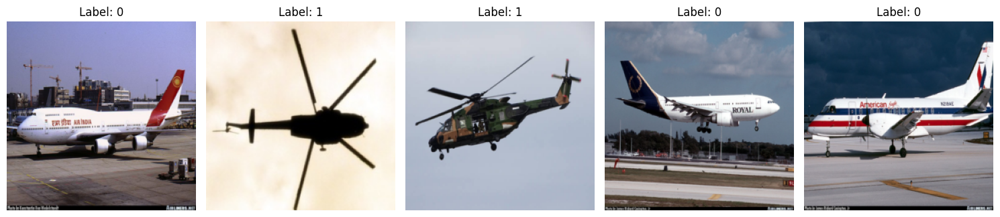

In [10]:
# Function to visualize random samples from the dataset
def visualize_samples(dataset, num_samples=5):
    fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))

    # Get random indices
    random_indices = random.sample(range(len(dataset)), num_samples)
    
    for i, idx in enumerate(random_indices):
        img, label = dataset[idx]

        # Convert the image tensor to a PIL image (if it’s a tensor)
        if isinstance(img, torch.Tensor):
            img = transforms.ToPILImage()(img)

        axes[i].imshow(img)
        axes[i].axis('off')
        axes[i].set_title(f"Label: {label}")

    plt.tight_layout()
    plt.show()

# Call the function
visualize_samples(train_dataset_basic, num_samples=5)


# Defining Different Models

In [11]:
# 1 Block model

class Model1Block(nn.Module):
    def __init__(self):
        super(Model1Block, self).__init__()
        # Block 1
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        # Fully connected layers
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(32 * 112 * 112, 128)
        self.fc2 = nn.Linear(128, 1)
        
    def forward(self, x):
        # Block 1
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        # Flatten
        x = self.flatten(x)
        # Fully connected layers
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))
        
        return x

summary(Model1Block().to(device), input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             896
         MaxPool2d-2         [-1, 32, 112, 112]               0
           Flatten-3               [-1, 401408]               0
            Linear-4                  [-1, 128]      51,380,352
            Linear-5                    [-1, 1]             129
Total params: 51,381,377
Trainable params: 51,381,377
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 18.38
Params size (MB): 196.00
Estimated Total Size (MB): 214.95
----------------------------------------------------------------


In [12]:
 # 3 Block model

class Model3Block(nn.Module):
    def __init__(self):
        super(Model3Block, self).__init__()
        # Block 1
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        # Block 2
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        # Block 3
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)        
        # Fully connected layers
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 28 * 28, 128)  # 128 channels * 28x28 (after 3 poolings)
        self.fc2 = nn.Linear(128, 1)
        
    def forward(self, x):
        # Block 1
        x = F.relu(self.conv1(x))
        x = self.pool(x)
        # Block 2
        x = F.relu(self.conv2(x))
        x = self.pool(x)
        # Block 3
        x = F.relu(self.conv3(x))
        x = self.pool(x)
        # Flatten
        x = self.flatten(x)
        # Fully connected layers
        x = F.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))
        
        return x
        
summary(Model3Block().to(device), input_size=(3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 224, 224]             896
         MaxPool2d-2         [-1, 32, 112, 112]               0
            Conv2d-3         [-1, 64, 112, 112]          18,496
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5          [-1, 128, 56, 56]          73,856
         MaxPool2d-6          [-1, 128, 28, 28]               0
           Flatten-7               [-1, 100352]               0
            Linear-8                  [-1, 128]      12,845,184
            Linear-9                    [-1, 1]             129
Total params: 12,938,561
Trainable params: 12,938,561
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.57
Forward/backward pass size (MB): 27.56
Params size (MB): 49.36
Estimated Total Size (MB): 77.49
----------------------------------

In [13]:
# Transfer learning using VGG16  with tuning all layers (including tuning convolution layers)

class VGGModel(nn.Module):
    def __init__(self):
        super(VGGModel, self).__init__()
        # Load VGG16 model with pretrained weights, including the classifier (fully connected) layers
        self.vgg16 = models.vgg16(weights='VGG16_Weights.DEFAULT')
        
        # Set all layers as trainable
        for param in self.vgg16.features.parameters():
            param.requires_grad = True
        
        # Modify the final fully connected layer in the classifier for binary classification
        num_features = self.vgg16.classifier[-1].in_features  # Get input features of the last layer
        self.vgg16.classifier[-1] = nn.Linear(num_features, 1)  # Replace with a layer that outputs 1 value
        
    def forward(self, x):
        # Forward pass through the entire model, including modified classifier
        x = self.vgg16(x)
        x = torch.sigmoid(x)  # Apply sigmoid to get probabilities for binary classification
        return x

summary(VGGModel().to(device), input_size=(3, 224, 224))

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:09<00:00, 56.6MB/s] 


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [14]:
# Transfer learning using VGG16 or VGG19 with tuning only final MLP layers (excluding convolution layers)

class VGGModel_1(nn.Module):
    def __init__(self):
        super(VGGModel_1, self).__init__()
        # Load VGG16 model with pretrained weights, including the classifier (fully connected) layers
        self.vgg16 = models.vgg16(weights='VGG16_Weights.DEFAULT')
        
        # Freeze all convolutional (feature extraction) layers, making them non-trainable
        for param in self.vgg16.features.parameters():
            param.requires_grad = False
        
        # Modify the final fully connected layer in the classifier for binary classification
        num_features = self.vgg16.classifier[-1].in_features  # Get input features of the last layer
        self.vgg16.classifier[-1] = nn.Linear(num_features, 1)  # Replace with a layer that outputs 1 value
        
    def forward(self, x):
        # Forward pass through the entire model, including modified classifier
        x = self.vgg16(x)
        x = torch.sigmoid(x)  # Apply sigmoid to get probabilities for binary classification
        return x
        
summary(VGGModel_1().to(device), [(3, 224, 224)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [35]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        
        # Defining the layers to achieve ~134M parameters
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(224 * 224 * 3, 512)
        self.fc2 = nn.Linear(512, 1024)
        self.fc3 = nn.Linear(1024, 2048)
        self.fc4 = nn.Linear(2048,4096)
        self.fc5 = nn.Linear(4096, 4096)
        self.fc6 = nn.Linear(4096, 4096)
        self.fc7 = nn.Linear(4096, 2048)
        self.fc8 = nn.Linear(2048, 1024)
        self.fc9 = nn.Linear(1024, 512)
        self.output = nn.Linear(512, 1)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        # Forward pass through the layers
        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = torch.relu(self.fc3(x))
        x = torch.relu(self.fc4(x))
        x = torch.relu(self.fc5(x))
        x = torch.relu(self.fc6(x))
        x = torch.relu(self.fc7(x))
        x = torch.relu(self.fc8(x))
        x = torch.relu(self.fc9(x))
        x = self.sigmoid(self.output(x))
        return x

mlp_model = MLP().to(device)
summary(mlp_model, (224, 224, 3))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1               [-1, 150528]               0
            Linear-2                  [-1, 512]      77,070,848
            Linear-3                 [-1, 1024]         525,312
            Linear-4                 [-1, 2048]       2,099,200
            Linear-5                 [-1, 4096]       8,392,704
            Linear-6                 [-1, 4096]      16,781,312
            Linear-7                 [-1, 4096]      16,781,312
            Linear-8                 [-1, 2048]       8,390,656
            Linear-9                 [-1, 1024]       2,098,176
           Linear-10                  [-1, 512]         524,800
           Linear-11                    [-1, 1]             513
          Sigmoid-12                    [-1, 1]               0
Total params: 132,664,833
Trainable params: 132,664,833
Non-trainable params: 0
-----------------------

In [15]:
def get_model(model_name):
    if model_name == "1_block":
        model = Model1Block()
    elif model_name == "3_block":
        model = Model3Block()
    elif model_name == "3_block_aug":
        model = Model3Block()
    elif model_name == "vgg_16":
        model = VGGModel()
    elif model_name == "vgg_16_1":
        model = VGGModel_1()
    elif model_name == "mlp":
        model = MLP()
    else:
        raise ValueError(f"Model {model_name} is not defined")
    return model

# Training and Evaluation

In [17]:
# Hyperparameters
num_epochs = 10
batch_size = 16
learning_rate = 1e-4

In [18]:
def log_images_with_predictions(dataset, targets, predictions, writer, step):
    num_images = len(targets)
    cols = 8  # You can set this to fit more images in each row if desired
    rows = (num_images + cols - 1) // cols  # Calculate rows needed to fit all images

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 2.5 * rows))
    axes = axes.flatten()

    for idx in range(num_images):
        img, true_label, pred_label = dataset[idx][0], targets[idx].item(), predictions[idx].item()
        img = img.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) format

        ax = axes[idx]
        ax.imshow(img)
        ax.axis('off')

        # Set title with true/pred labels
        title_color = "green" if true_label == pred_label else "red"
        ax.set_title(f"True: {int(true_label)} | Pred: {int(pred_label)}", color=title_color)

    # Turn off any unused axes (in case num_images is not a multiple of cols)
    for ax in axes[num_images:]:
        ax.axis('off')

    # Save and log the plot to TensorBoard
    plt.tight_layout()
    plt_path = "temp_plot_final_epoch.jpg"
    plt.savefig(plt_path, bbox_inches='tight', format='jpg')
    plt.close(fig)

    # Load the image and add to TensorBoard
    pil_img = Image.open(plt_path)
    img_np = np.array(pil_img)
    writer.add_image("Test Images with Predictions", img_np.transpose(2, 0, 1), global_step=step)


In [25]:
batch_size = 16
train_loader = DataLoader(dataset=train_dataset_basic, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset=test_dataset_basic, batch_size=batch_size, shuffle=False)

In [46]:
def evaluate_mlp(model, test_loader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.unsqueeze(1).float().to(device)

            # Forward pass
            outputs = model(X_batch)
            
            # Applying threshold for binary classification
            predicted = (outputs > 0.5).float()  
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()

    accuracy = correct / total
    print(f"Accuracy: {accuracy:.4f}")
    return accuracy

In [47]:
def train_and_evaluate_mlp(model_name,train_loader,test_loader,epochs=10,learning_rate = 1e-4):
    model = MLP().to(device)
    criterion = nn.BCELoss()  
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    for epoch in range(epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.unsqueeze(1).float().to(device)
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            
            # Backward pass and optimization step
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
        
        # Calculating and displaying average training loss
        train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch + 1}/{epochs}], Training Loss: {train_loss:.4f}")
    model_dir = "/kaggle/working/saved_models"
    os.makedirs(model_dir, exist_ok=True)
    torch.save(model.state_dict(), os.path.join(model_dir, f"{model_name}_final.pth"))
    evaluate_mlp(model,test_loader)

In [48]:
train_and_evaluate_mlp("mlp",train_loader,test_loader)

Epoch [1/10], Training Loss: 0.6815
Epoch [2/10], Training Loss: 0.6394
Epoch [3/10], Training Loss: 0.5648
Epoch [4/10], Training Loss: 0.3921
Epoch [5/10], Training Loss: 0.2634
Epoch [6/10], Training Loss: 0.2883
Epoch [7/10], Training Loss: 0.4493
Epoch [8/10], Training Loss: 0.2730
Epoch [9/10], Training Loss: 0.1459
Epoch [10/10], Training Loss: 0.0880
Accuracy: 1.0000


# Hard and Easy Classification Task

In [66]:
from tqdm import tqdm

In [67]:
basic_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224
    transforms.ToTensor()           # Convert to tensor and normalize to [0, 1]
])

def load_images_from_directory(root_dir, transform=basic_transform):
    images = []
    labels = []
    
    # Label mapping based on folder structure: 0 for 'Aero', 1 for 'Heli'
    label_map = {'Aero': 0, 'Heli': 1}
    
    for class_name, label in label_map.items():
        class_dir = os.path.join(root_dir, class_name)
        for filename in tqdm(os.listdir(class_dir), desc=f"Processing {class_name} images"):
            if filename.endswith(".jpg"):
                image_path = os.path.join(class_dir, filename)
                image = Image.open(image_path).convert("RGB")
                
                # Applying transformation
                if transform:
                    image = transform(image)
                
                # Appending the processed image and its label
                images.append(image)
                labels.append(label)
    
    # Stacking images and labels into tensors
    images = torch.stack(images)
    labels = torch.tensor(labels)
    
    return images, labels

In [68]:
X_hard_test, y_hard_test = load_images_from_directory(hard_dir)
X_easy_test, y_easy_test = load_images_from_directory(easy_dir)

Processing Heli images: 100%|██████████| 4/4 [00:00<00:00, 38.20it/s]


In [69]:
def get_model(model_name):
    if model_name == "1_block":
        model = Model1Block()
    elif model_name == "3_block":
        model = Model3Block()
    elif model_name == "3_block_aug":
        model = Model3Block()
    elif model_name == "vgg_16":
        model = VGGModel()
    elif model_name == "vgg_16_1":
        model = VGGModel_1()
    elif model_name == "mlp":
        model = MLP()
    else:
        raise ValueError(f"Model {model_name} is not defined")
    return model

In [77]:
def display_images(X,y,pred):
    pred = pred.view(-1).cpu().numpy()
    num_images = len(X)
    rows = 2 
    cols = 4
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 6))
    axes = axes.flatten()
    
    # Display each image with its label
    for i in range(num_images):
        axes[i].imshow(X[i].permute(1,2,0))
        axes[i].set_title(f"Label: {y[i]} Pred:{pred[i]}")
        axes[i].axis("off") 
    
    plt.tight_layout()
    plt.show()

In [112]:
def load_and_predict(model_name, X_hard_test, X_easy_test, y_hard_test, y_easy_test):
    # Initialize and load the model
    model = get_model(model_name).to(device)
    model_path = f"/kaggle/input/saved_models/pytorch/default/1/Models/{model_name}_final.pth"
    if(model_name=="mlp"):
        model_path = "/kaggle/working/saved_models/mlp_final.pth"
    model.load_state_dict(torch.load(model_path))
    
    # Set the model to evaluation mode
    model.eval()

    # Perform predictions with no gradient tracking
    with torch.no_grad():
        # Forward pass on hard and easy test sets
        scores_hard = model(X_hard_test.to(device))
        scores_easy = model(X_easy_test.to(device))

        # Convert scores to binary predictions
        predictions_hard = (scores_hard > 0.5).float()
        predictions_easy = (scores_easy > 0.5).float()
        
        # Calculate accuracy for hard test set
        correct_hard = (predictions_hard.squeeze() == y_hard_test.to(device).squeeze()).sum().item()
        accuracy_hard = correct_hard / y_hard_test.size(0)

        # Calculate accuracy for easy test set
        correct_easy = (predictions_easy.squeeze() == y_easy_test.to(device).squeeze()).sum()
        accuracy_easy = correct_easy / y_easy_test.size(0)
        
        # Print accuracies
        print(f"Accuracy on hard test set: {accuracy_hard:.4f}")
        print(f"Accuracy on easy test set: {accuracy_easy:.4f}")
    # display images
    display_images(X_hard_test,y_hard_test,predictions_hard)
    display_images(X_easy_test,y_easy_test,predictions_easy)

Accuracy on hard test set: 0.6250
Accuracy on easy test set: 0.7500


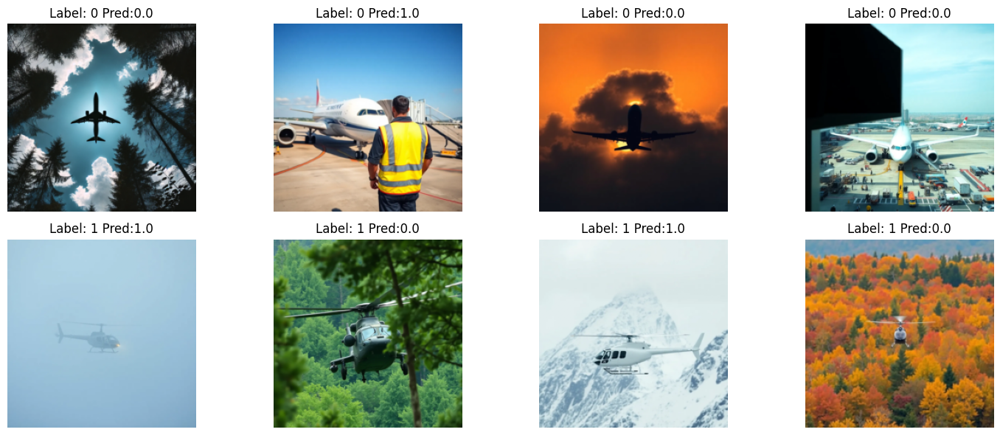

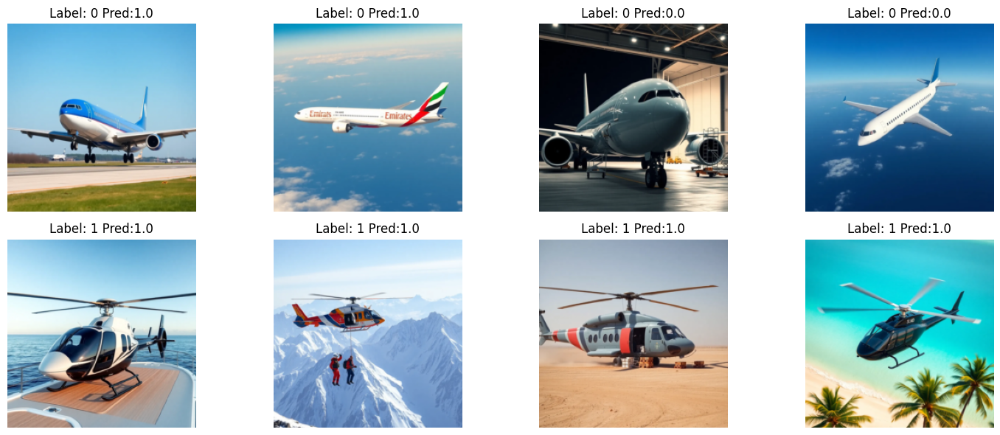

In [104]:
load_and_predict("1_block", X_hard_test, X_easy_test, y_hard_test, y_easy_test)

Accuracy on hard test set: 0.6250
Accuracy on easy test set: 0.6250


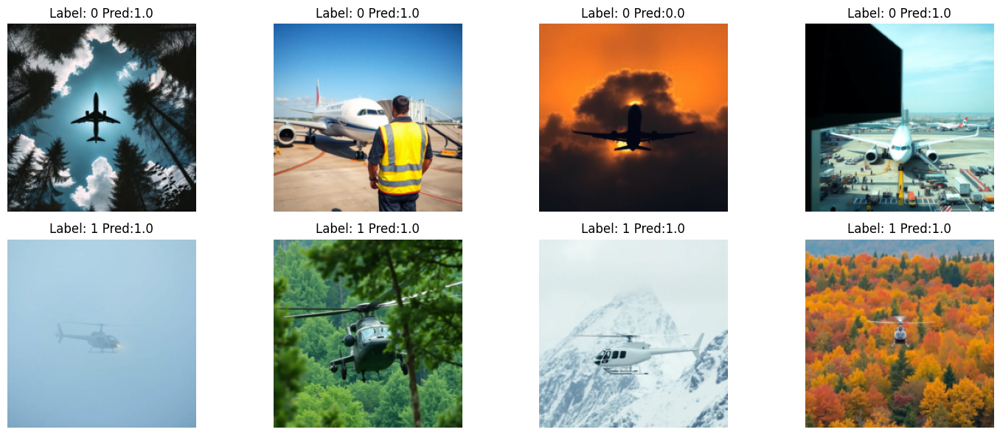

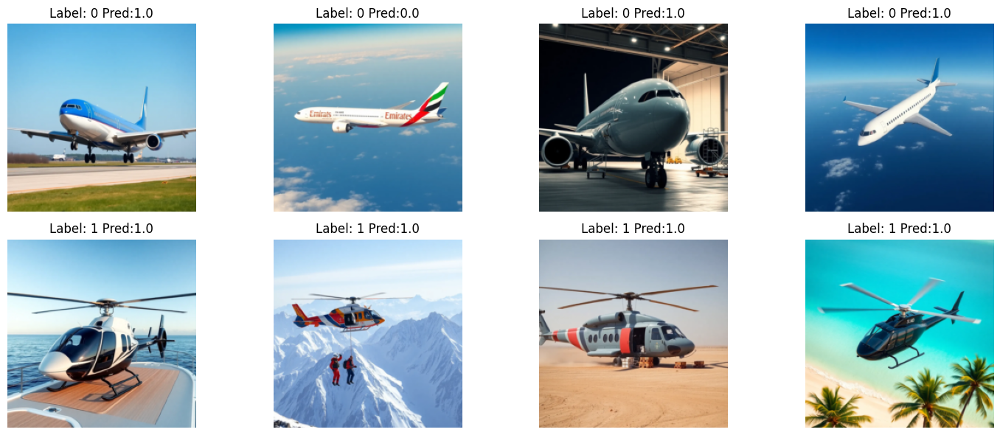

In [105]:
load_and_predict("3_block", X_hard_test, X_easy_test, y_hard_test, y_easy_test)

Accuracy on hard test set: 0.5000
Accuracy on easy test set: 0.6250


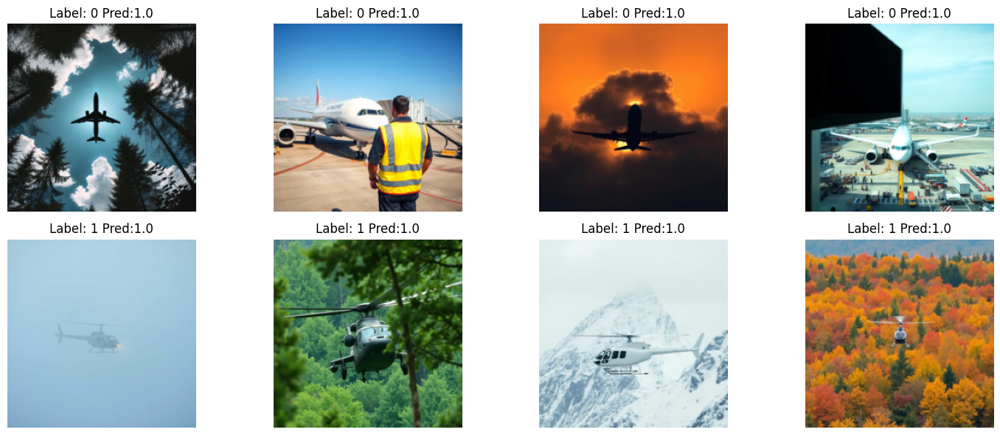

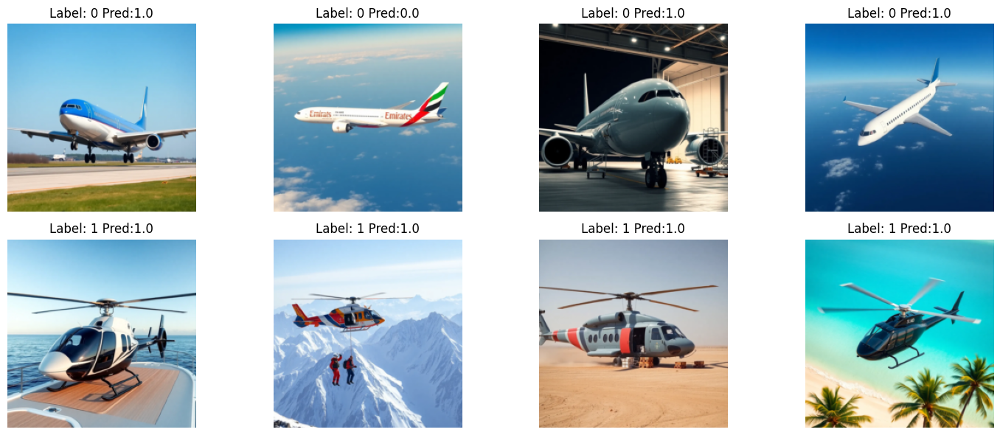

In [107]:
load_and_predict("3_block_aug", X_hard_test, X_easy_test, y_hard_test, y_easy_test)

Accuracy on hard test set: 0.5000
Accuracy on easy test set: 0.5000


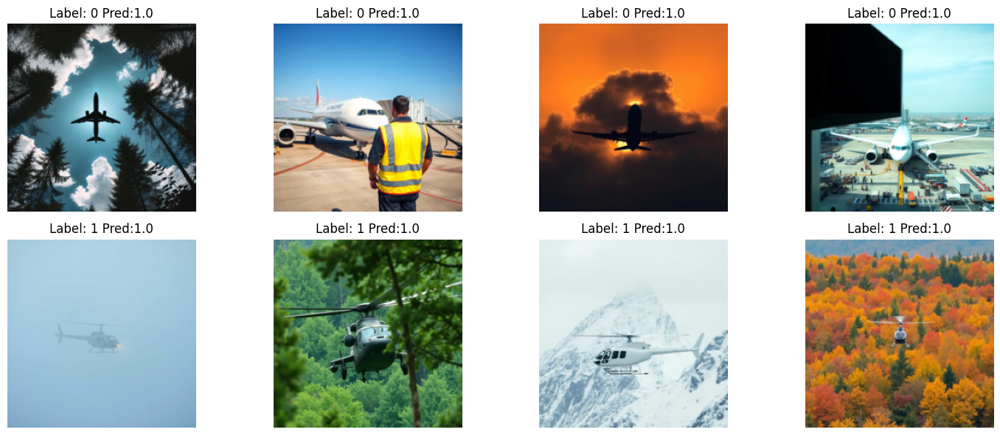

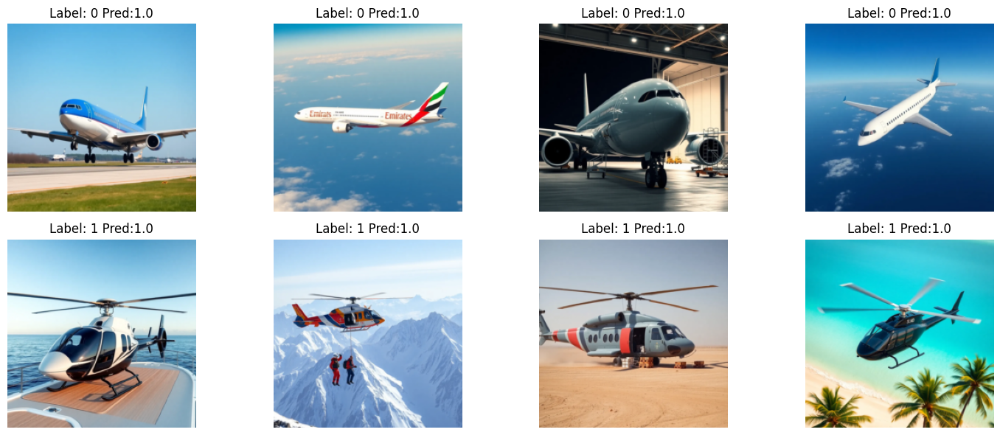

In [108]:
load_and_predict("vgg_16", X_hard_test, X_easy_test, y_hard_test, y_easy_test)

Accuracy on hard test set: 0.5000
Accuracy on easy test set: 1.0000


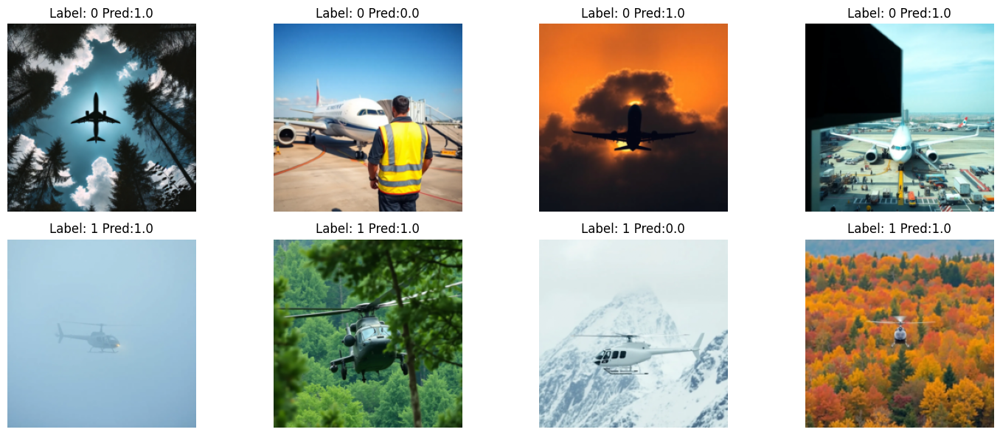

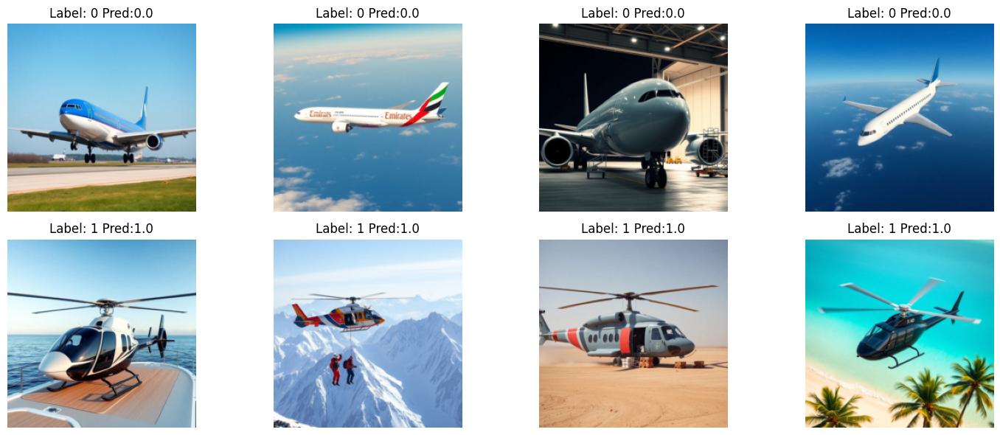

In [109]:
load_and_predict("vgg_16_1", X_hard_test, X_easy_test, y_hard_test, y_easy_test)

Accuracy on hard test set: 0.7500
Accuracy on easy test set: 0.6250


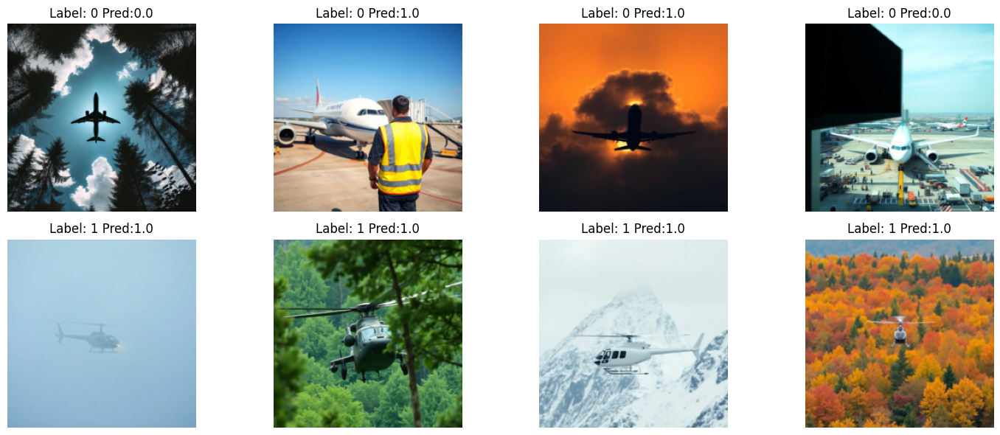

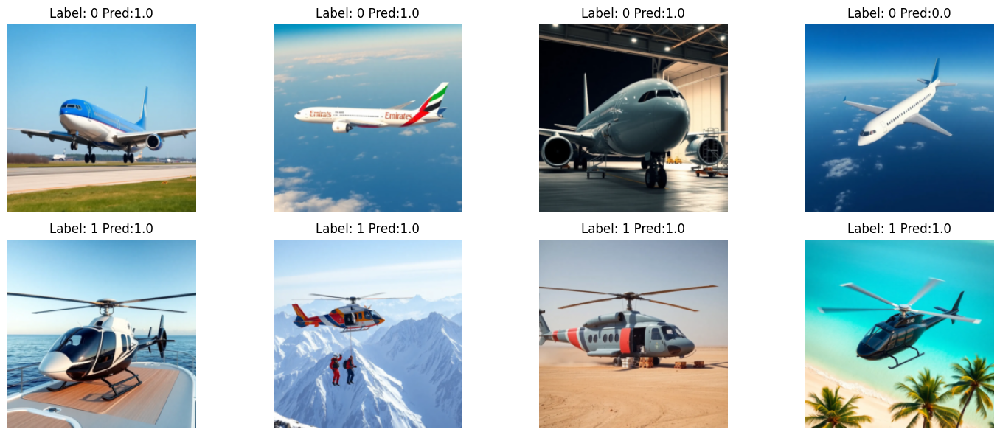

In [114]:
load_and_predict("mlp", X_hard_test, X_easy_test, y_hard_test, y_easy_test)